<a href="https://colab.research.google.com/github/ARSHITHbabu/ProactiveCare-AI/blob/main/ProactiveCare_AI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## ***1) IMPORT***

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gym
from gym import spaces
import tensorflow as tf
from tensorflow import keras
!pip install shap
import shap


## ***2) Function to create an enhanced synthetic dataset***

In [ ]:
def generate_enhanced_synthetic_data(num_samples=1000):
    sensor_data = np.random.uniform(-3, 3, (num_samples, 5))
    additional_feature_1 = np.sum(sensor_data, axis=1) + np.random.normal(0, 0.5, num_samples)
    additional_feature_2 = np.prod(sensor_data, axis=1)
    rul = np.maximum(0, 100 - np.sum(sensor_data, axis=1))
    data = pd.DataFrame(sensor_data, columns=[f'Sensor_{i+1}' for i in range(sensor_data.shape[1])])
    data['Additional_Feature_1'] = additional_feature_1
    data['Additional_Feature_2'] = additional_feature_2
    data['RUL'] = rul
    return data


## ***3) Generate enhanced synthetic data and save to CSV***

In [ ]:
synthetic_data = generate_enhanced_synthetic_data(1000)
synthetic_data.to_csv('enhanced_synthetic_maintenance_data.csv', index=False)
synthetic_data.head()


,Sensor_1,Sensor_2,Sensor_3,Sensor_4,Sensor_5,Additional_Feature_1,Additional_Feature_2,RUL
0,2.440566,-1.723995,-1.251635,-2.400956,2.218952,-0.906742,-28.056700,100.717070
1,2.425573,-1.578625,0.443835,0.652551,-0.937925,1.322393,1.040153,98.994592
2,-2.737232,-2.518961,0.856362,-0.327561,1.123297,-3.269548,-2.172591,103.604095
3,-1.929250,-1.459951,-2.937729,-2.574067,-0.469591,-9.807864,-10.001798,109.370588
4,-0.893970,-1.926974,-0.138575,-1.515747,2.880741,-1.479251,1.042356,101.594526


## ***4) Define the Maintenance Environment***

In [ ]:
class MaintenanceEnv(gym.Env):
    def __init__(self, data):
        super(MaintenanceEnv, self).__init__()
        self.data = data.reset_index(drop=True)
        self.current_step = 0
        self.action_space = spaces.Discrete(2)
        self.observation_space = spaces.Box(low=-3, high=3, shape=(7,), dtype=np.float32)

    def reset(self):
        self.current_step = 0
        return self.data.iloc[self.current_step, :-1].values

    def step(self, action):
        sensor_values = self.data.iloc[self.current_step, :-1].values
        reward = 0

        if action == 0:
            if self.data.iloc[self.current_step]['RUL'] > 0:
                reward = 1
            else:
                reward = -1
        else:
            if self.data.iloc[self.current_step]['RUL'] <= 0:
                reward = 1
            else:
                reward = -1

        self.current_step += 1

        done = self.current_step >= len(self.data) - 1
        next_state = self.data.iloc[self.current_step, :-1].values if not done else sensor_values
        return next_state, reward, done, {}

    def render(self):
        pass


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## ***5) Initialize the environment***

In [ ]:
env = MaintenanceEnv(synthetic_data)


## ***6) Deep Learning Model for RUL prediction***

In [ ]:
def create_deep_learning_model(input_shape):
    model = keras.Sequential([
        keras.layers.Dense(64, activation='relu', input_shape=input_shape),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(1, activation='linear')
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

input_shape = (synthetic_data.shape[1] - 1,)
dl_model = create_deep_learning_model(input_shape)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## ***7) Training the Deep Learning model***

In [ ]:
X = synthetic_data.drop(columns=['RUL']).values
y = synthetic_data['RUL'].values

history = dl_model.fit(X, y, epochs=500, batch_size=32, verbose=1)


Epoch 1/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 9626.9414
Epoch 2/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 8346.4287
Epoch 3/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6828.0815
Epoch 4/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5514.1597
Epoch 5/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4398.4277
Epoch 6/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3522.3418 
Epoch 7/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 2981.3091 
Epoch 8/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2623.8586 
Epoch 9/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2110.8389
Epoch 10/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1920.8105
Epoch 11/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1455.3029
Epoch 12/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1132.5493
Epoch 13/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 988.8674
Epoch 14/500
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 761.1622
Epoch 15/500
32/32 ━━━━━━━━━

## ***8)Plot training loss over epochs***

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


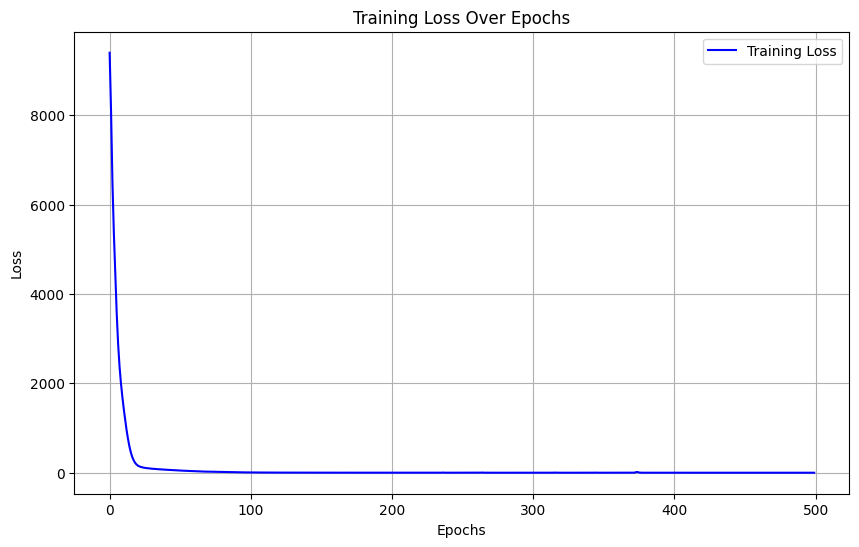

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', color='blue')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid()
plt.show()


## ***9) Initialize Q-table and hyperparameters***

In [ ]:
num_states = 10
action_size = 2
q_table = np.zeros((num_states, action_size))

learning_rate = 0.1
discount_factor = 0.95
num_episodes = 1000


## ***10) Function to discretize the state***

In [ ]:
def discretize_state(state):
    bins = np.linspace(-3, 3, num_states)
    discretized_state = np.digitize(state, bins) - 1
    discretized_state = np.clip(discretized_state, 0, num_states - 1)
    return discretized_state


## ***11) Training the Q-learning agent***

In [ ]:
reward_per_episode = []

epsilon = 0.1
for episode in range(num_episodes):
    state = env.reset()
    state_index = discretize_state(state)
    total_reward = 0

    for t in range(10):

        if np.random.rand() < epsilon:
            action = np.random.choice(action_size)
        else:
            action = np.argmax(q_table[state_index])

        next_state, reward, done, _ = env.step(action)
        next_state_index = discretize_state(next_state)

        q_table[state_index][action] += learning_rate * (reward + discount_factor * np.max(q_table[next_state_index]) - q_table[state_index][action])

        total_reward += reward
        state_index = next_state_index

        if done:
            break

    reward_per_episode.append(total_reward)

    if episode % 100 == 0:
        print(f"Episode {episode}: Total Reward: {total_reward}")


Episode 0: Total Reward: 8
Episode 100: Total Reward: 8
Episode 200: Total Reward: 10
Episode 300: Total Reward: 10
Episode 400: Total Reward: 10
Episode 500: Total Reward: 10
Episode 600: Total Reward: 8
Episode 700: Total Reward: 8
Episode 800: Total Reward: 8
Episode 900: Total Reward: 10


## ***12) Plot the Total Reward per Episode***

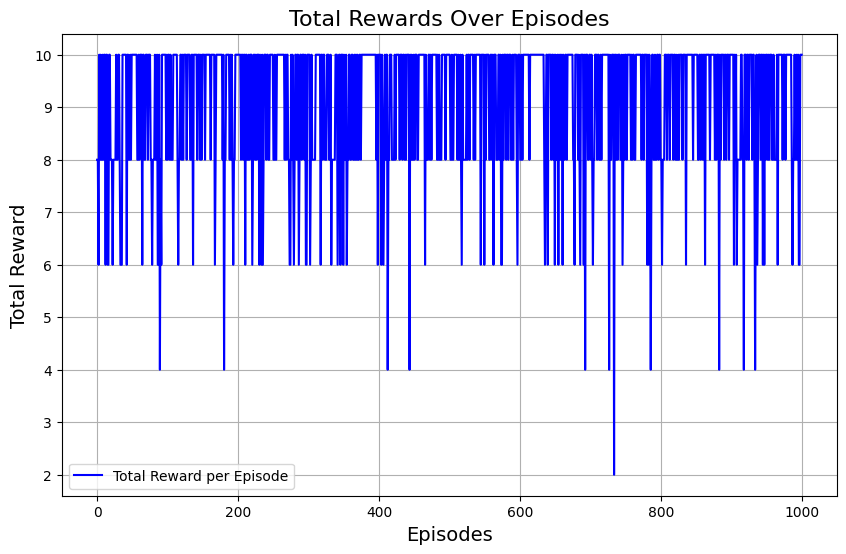

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(reward_per_episode, color='blue', label='Total Reward per Episode')

plt.title('Total Rewards Over Episodes', fontsize=16)
plt.xlabel('Episodes', fontsize=14)
plt.ylabel('Total Reward', fontsize=14)

plt.grid(True)

plt.legend()

plt.show()


## ***13) Evaluate the Q-learning agent***

In [ ]:
total_reward = 0
state = env.reset()
state_index = discretize_state(state)

for _ in range(len(synthetic_data) - 1):
    action = np.argmax(q_table[state_index])
    next_state, reward, done, _ = env.step(action)
    state_index = discretize_state(next_state)
    total_reward += reward
    if done:
        break

print(f"Total Reward in Evaluation: {total_reward}")


Total Reward in Evaluation: 999


## ***14) Function to create time-series features***

In [ ]:
def add_time_series_features(data):
    data['Rolling_Mean_Sensor_1'] = data['Sensor_1'].rolling(window=10).mean()
    data['Rolling_Std_Sensor_1'] = data['Sensor_1'].rolling(window=10).std()
    return data


## ***15) Enhance synthetic data with time-series features***

In [ ]:
synthetic_data = add_time_series_features(synthetic_data)

synthetic_data.tail(15)


,Sensor_1,Sensor_2,Sensor_3,Sensor_4,Sensor_5,Additional_Feature_1,Additional_Feature_2,RUL,Rolling_Mean_Sensor_1,Rolling_Std_Sensor_1
985,-0.586948,-0.116724,-0.483234,-0.308007,1.482284,-0.018183,0.015115,100.012628,-1.060670,1.045797
986,-1.563807,-0.147929,0.896327,0.590788,-0.704899,-0.968193,-0.086350,100.929520,-1.185887,1.020813
987,-2.747847,-1.825148,1.863008,1.720296,1.376513,-0.031771,22.125268,99.613179,-1.342102,1.134030
988,1.026191,-1.095911,1.462372,1.616527,0.983683,3.897052,-2.615168,96.007139,-1.011984,1.300554
989,-0.705794,-2.066962,-1.067756,0.845753,2.708936,-0.212225,-3.568815,100.285823,-1.016429,1.299297
990,1.711844,-1.093102,1.930148,-0.193879,-0.043373,3.142745,-0.030372,97.688362,-0.642841,1.499114
991,2.246266,1.206001,1.282686,2.456174,0.101584,6.839545,0.866988,92.707289,-0.414716,1.753825
992,-1.429084,1.452063,0.400821,-1.729414,-0.795722,-2.247382,-1.144600,102.101337,-0.334086,1.677703
993,0.461178,2.496575,-2.291651,0.222084,-2.594000,-1.369372,1.520016,101.705814,-0.359469,1.661913
994,2.060863,-2.433284,-1.162949,0.234010,-2.234658,-4.102697,-3.049641,103.536016,0.047286,1.711002


## ***16) Visualize the original sensor data and the new features***

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


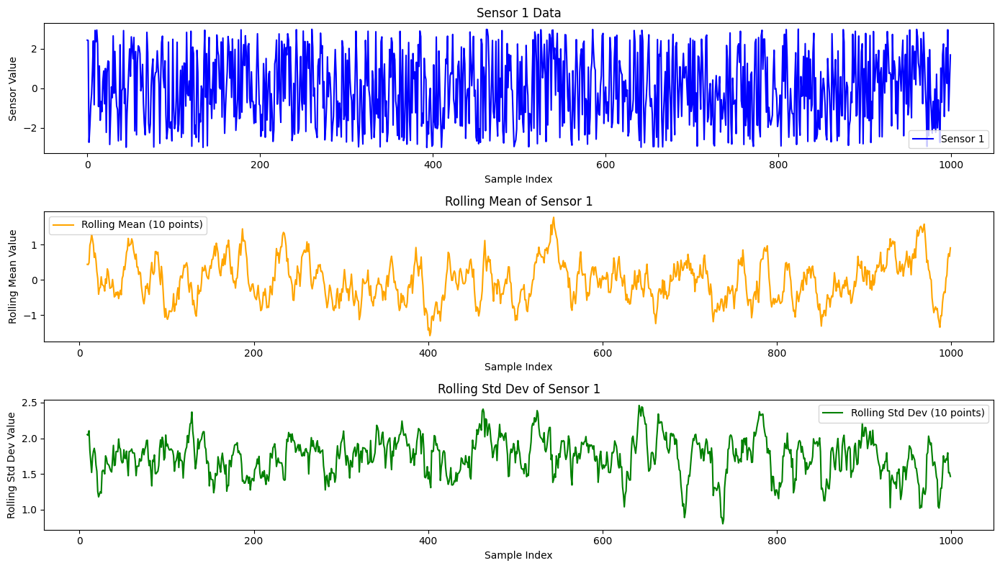

In [ ]:
plt.figure(figsize=(14, 8))

plt.subplot(3, 1, 1)
plt.plot(synthetic_data['Sensor_1'], label='Sensor 1', color='blue')
plt.title('Sensor 1 Data')
plt.xlabel('Sample Index')
plt.ylabel('Sensor Value')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(synthetic_data['Rolling_Mean_Sensor_1'], label='Rolling Mean (10 points)', color='orange')
plt.title('Rolling Mean of Sensor 1')
plt.xlabel('Sample Index')
plt.ylabel('Rolling Mean Value')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(synthetic_data['Rolling_Std_Sensor_1'], label='Rolling Std Dev (10 points)', color='green')
plt.title('Rolling Std Dev of Sensor 1')
plt.xlabel('Sample Index')
plt.ylabel('Rolling Std Dev Value')
plt.legend()

plt.tight_layout()
plt.show()


## ***17) Create lag features and additional features***

In [ ]:
for lag in range(1, 4):
    synthetic_data[f'Sensor_1_Lag_{lag}'] = synthetic_data['Sensor_1'].shift(lag)

synthetic_data['EMA_Sensor_1'] = synthetic_data['Sensor_1'].ewm(span=10, adjust=False).mean()

synthetic_data['Z_Score_Sensor_1'] = (synthetic_data['Sensor_1'] - synthetic_data['Sensor_1'].mean()) / synthetic_data['Sensor_1'].std()
synthetic_data['Anomaly_Sensor_1'] = synthetic_data['Z_Score_Sensor_1'].apply(lambda x: 1 if abs(x) > 3 else 0)

synthetic_data['Sensor_Ratio'] = synthetic_data['Sensor_1'] / synthetic_data['Sensor_2']
synthetic_data['Sensor_Product'] = synthetic_data['Sensor_1'] * synthetic_data['Sensor_3']

print(synthetic_data.tail(15))


     Sensor_1  Sensor_2  Sensor_3  Sensor_4  Sensor_5  Additional_Feature_1  \
985 -0.586948 -0.116724 -0.483234 -0.308007  1.482284             -0.018183   
986 -1.563807 -0.147929  0.896327  0.590788 -0.704899             -0.968193   
987 -2.747847 -1.825148  1.863008  1.720296  1.376513             -0.031771   
988  1.026191 -1.095911  1.462372  1.616527  0.983683              3.897052   
989 -0.705794 -2.066962 -1.067756  0.845753  2.708936             -0.212225   
990  1.711844 -1.093102  1.930148 -0.193879 -0.043373              3.142745   
991  2.246266  1.206001  1.282686  2.456174  0.101584              6.839545   
992 -1.429084  1.452063  0.400821 -1.729414 -0.795722             -2.247382   
993  0.461178  2.496575 -2.291651  0.222084 -2.594000             -1.369372   
994  2.060863 -2.433284 -1.162949  0.234010 -2.234658             -4.102697   
995  0.247586 -1.136495  2.003746  1.558705  2.583497              4.446644   
996  2.965515  2.030677 -0.921731  0.562476  2.13481

## ***18) Mean-SHAP-Values Based on Features***

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
 1/40 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

/usr/local/lib/python3.10/dist-packages/shap/explainers/_kernel.py:640: DeprecationWarning: l1_reg='auto' is deprecated and in a future version the behavior will change from a conditional use of AIC to simply a fixed number of top features. Pass l1_reg='num_features(10)' to opt-in to the new default behaviour.
  warnings.warn(


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

<ipython-input-48-d6f4ea280981>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=shap_importance_df, x='Mean SHAP Value', y='Feature', palette='viridis')
/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1281: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby 

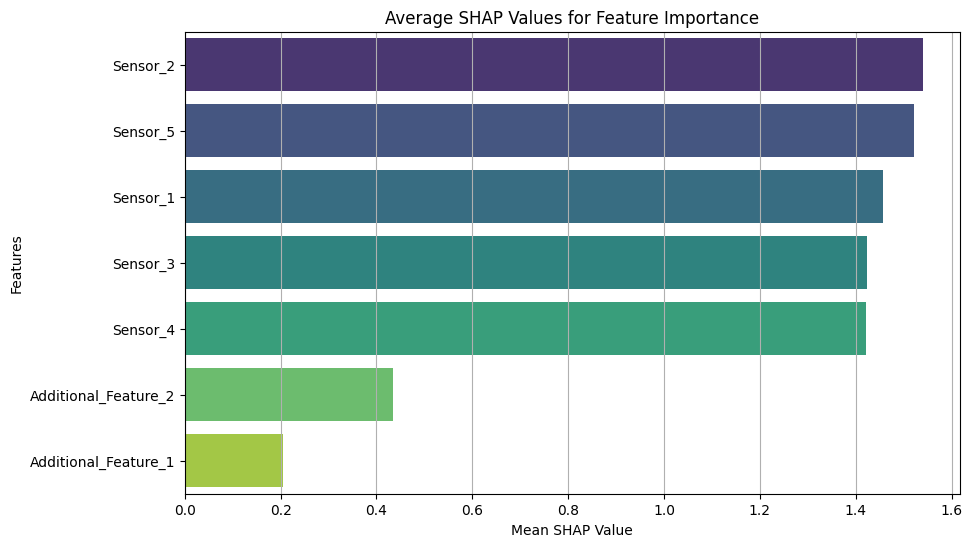

In [ ]:
import shap
import seaborn as sns

K= 10
X_kmeans = shap.kmeans(X, K)

explainer = shap.KernelExplainer(dl_model.predict, X_kmeans)
shap_values = explainer.shap_values(X)

mean_shap_values = np.mean(np.abs(shap_values), axis=0)

features_for_shap = ['Sensor_1', 'Sensor_2', 'Sensor_3', 'Sensor_4', 'Sensor_5', 'Additional_Feature_1', 'Additional_Feature_2']
print("Features for SHAP:", features_for_shap)
print("Length of features_for_shap:", len(features_for_shap))

if len(features_for_shap) == mean_shap_values.shape[0]:
    shap_importance_df = pd.DataFrame({
        'Feature': features_for_shap,
        'Mean SHAP Value': mean_shap_values.flatten()
    })

    shap_importance_df = shap_importance_df.sort_values(by='Mean SHAP Value', ascending=False)

    plt.figure(figsize=(10, 6))
    sns.barplot(data=shap_importance_df, x='Mean SHAP Value', y='Feature', palette='viridis')
    plt.title('Average SHAP Values for Feature Importance')
    plt.xlabel('Mean SHAP Value')
    plt.ylabel('Features')
    plt.grid(axis='x')
    plt.show()
else:
    print("Length mismatch: Features for SHAP:", len(features_for_shap), "Mean SHAP Values:", len(mean_shap_values))


## ***19) Visualize the pairwise relationships in the dataset***

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1513: UserWarning: Ignoring `palette` because no `hue` variable h

<Figure size 1400x1000 with 0 Axes>

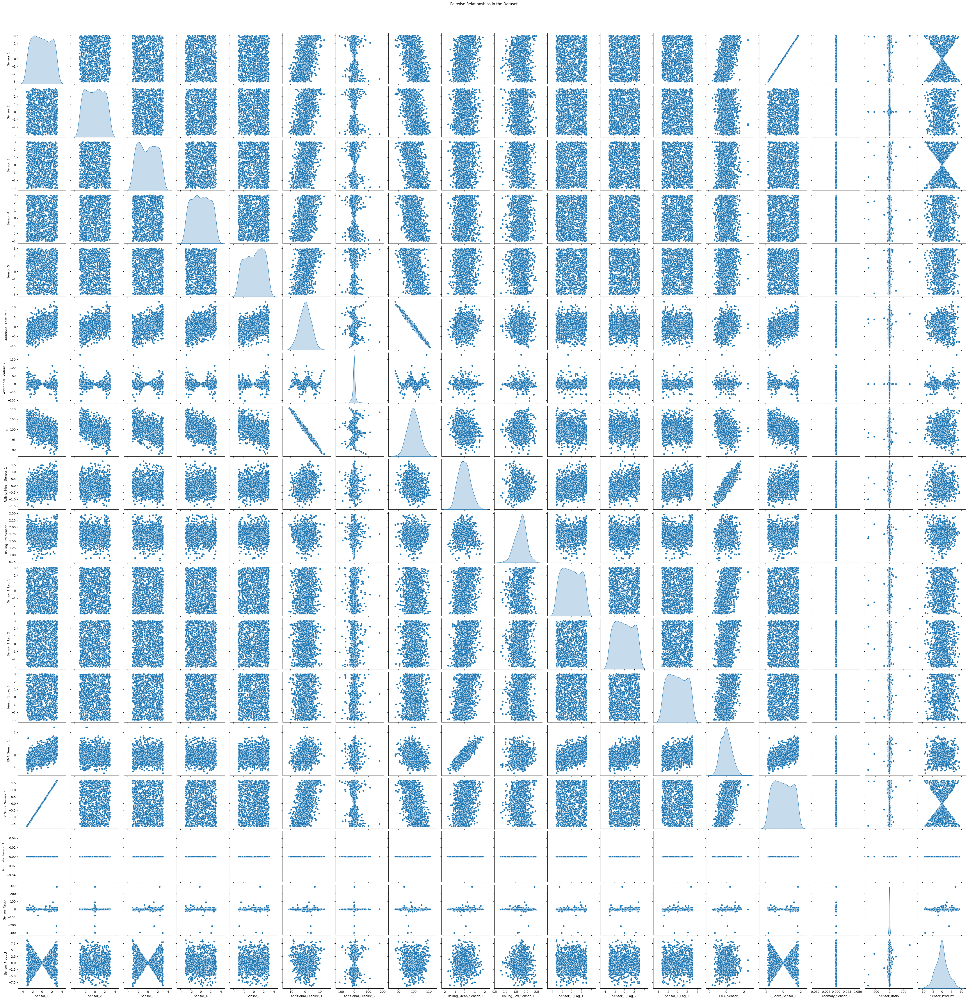

In [ ]:
import seaborn as sns

plt.figure(figsize=(14, 10))
sns.pairplot(synthetic_data, diag_kind='kde', palette='Set2')
plt.suptitle('Pairwise Relationships in the Dataset', y=1.02)
plt.show()


## ***20) Create a correlation heatmap***

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


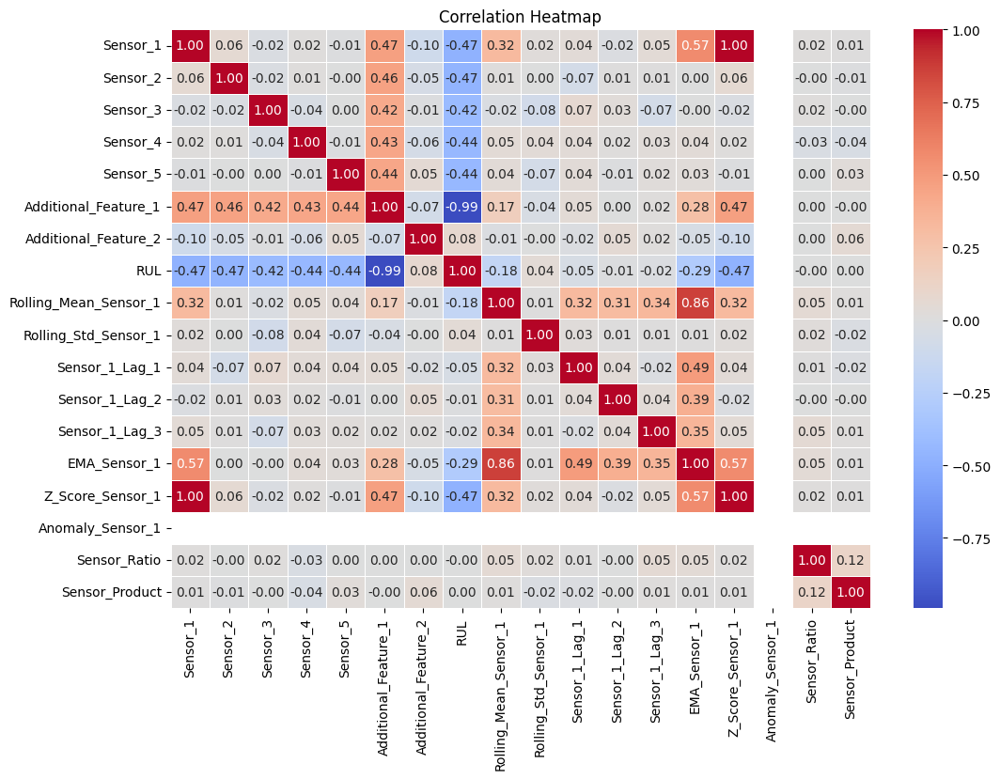

In [ ]:
plt.figure(figsize=(12, 8))
correlation_matrix = synthetic_data.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()


## ***21) Plot predicted vs actual RUL***

17/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


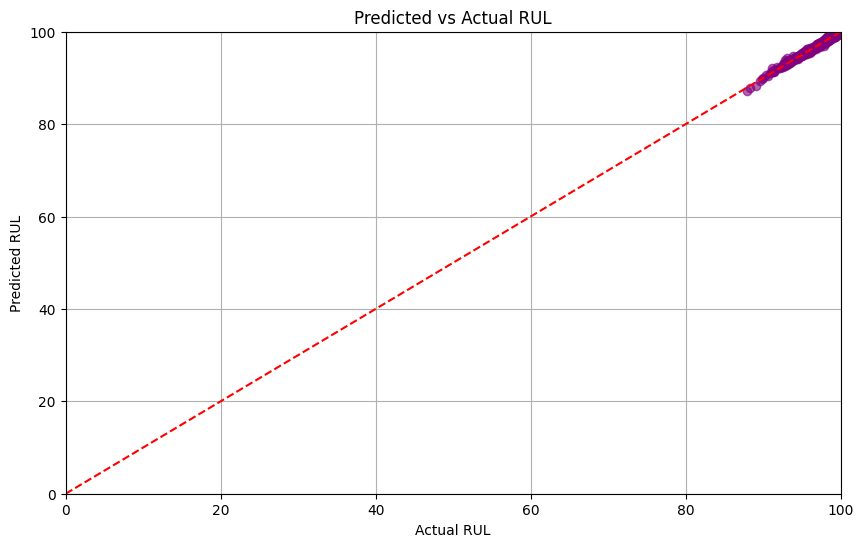

In [ ]:
predicted_rul = dl_model.predict(X)
plt.figure(figsize=(10, 6))
plt.scatter(synthetic_data['RUL'], predicted_rul, color='purple', alpha=0.6)
plt.plot([0, 100], [0, 100], '--', color='red')
plt.title('Predicted vs Actual RUL')
plt.xlabel('Actual RUL')
plt.ylabel('Predicted RUL')
plt.grid()
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.show()


## ***22) Impact of All Sensors on Predicted RUL***

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


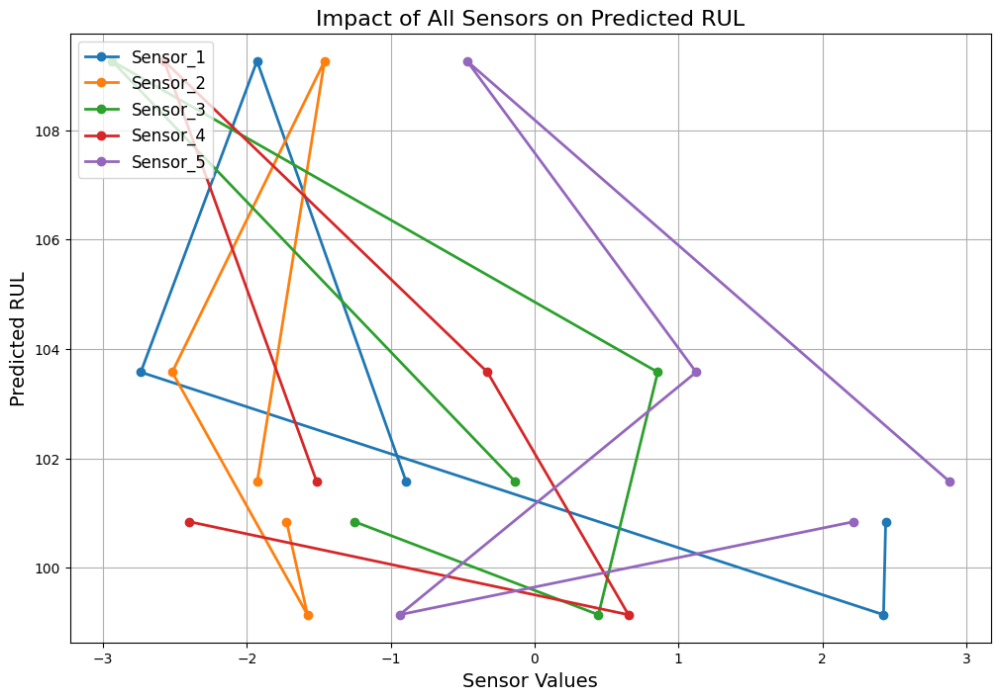

In [ ]:
import matplotlib.pyplot as plt

X_sample = X[:5]
predicted_values = dl_model.predict(X_sample)

plt.figure(figsize=(12, 8))

for i in range(5):
    plt.plot(X_sample[:, i], predicted_values, marker='o', label=f'Sensor_{i+1}', linewidth=2)

plt.title('Impact of All Sensors on Predicted RUL', fontsize=16)
plt.xlabel('Sensor Values', fontsize=14)
plt.ylabel('Predicted RUL', fontsize=14)
plt.legend(loc='upper left', fontsize=12)
plt.grid(True)

plt.show()
